In [1]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp, utils as utils
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
%load_ext autoreload
%autoreload 2

In [2]:
def occlude(top, bottom, distance=1e-6):
    try:
        return bottom.difference(top)
    except TopologicalError:
        return bottom.buffer(distance).difference(top.buffer(distance))

In [3]:
class ParticleCluster(object):
    
    def __init__(
        self,
        pos,
        perlin_grid,
    ):
        self.pos = Point(pos)
        self.pg = perlin_grid
        self.particles = []
        
    def gen_start_pts_gaussian(
            self,
            n_particles=10,
            xloc=0.,
            xscale=1.,
            yloc=0.,
            yscale=1.,
        ):
        xs = self.pos.x + ss.norm(loc=xloc, scale=xscale).rvs(n_particles)
        ys = self.pos.y + ss.norm(loc=yloc, scale=yscale).rvs(n_particles)
        self.start_pts = [Point((x,y)) for x,y in zip(xs, ys)]
        
    def init_particles(self, start_bounds=None):
        for pt in self.start_pts:
            p = gp.Particle(pos=pt, grid=self.pg)
            if start_bounds == None:
                self.particles.append(p)
            elif start_area.contains(p.pos):
                self.particles.append(p)
                
    @functools.singledispatchmethod           
    def step(self, n_steps):
        for p,n in zip(self.particles, n_steps):
            for i in range(n):
                p.step()
    
    @step.register
    def _(self, n_steps: int):
        n_steps = [n_steps] * len(self.particles)
        for p,n in zip(self.particles, n_steps):
                for i in range(n):
                    p.step()
                    
    @property
    def lines(self):
        return MultiLineString([p.line for p in self.particles])
    

In [4]:
@dataclass
class ScaleTransPrms(gp.DataClassBase):
    
    n_iters: int = 100
    d_buffer: float = -0.25
    d_translate_factor: float = 0.9
    d_translate: float = None
    angles: float = 0.
    d_translates: list = field(default=None, init=False)
    def __post_init__(self):
        self.d_buffers = np.array([self.d_buffer] * self.n_iters)
        
        if self.d_translates == None:
            if self.d_translate != None:
                self.d_translates =  np.array([self.d_translate] * self.n_iters)
            else:
                self.d_translates = self.d_buffers * self.d_translate_factor
    
    @property
    def prms(self):
        varnames = ['d_buffers', 'd_translates', 'angles']
        return {var: getattr(self, var) for var in varnames}

In [5]:
def individual_difference(multipolygon0, multipolygon1, dist=1e-6):
    diffs = []
    for p0, p1 in itertools.product(multipolygon0, multipolygon1):
        if p0.overlaps(p1):
            try:
                diff = p0.difference(p1)
            except TopologicalError:
                diff = p0.buffer(dist).difference(p1.buffer(dist))
            diffs.append(diff)
    return diffs

## try 1

In [200]:
page_x_inches: float = 11. # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':3,
    'ystep':3,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0073,
    'noiseSeed':6
}

particle_init_grid_params = {
    'xstep':16,
    'ystep':16,
}

buffer_style = 2

In [3]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])
pg = gp.PerlinGrid(drawbox, **perlin_grid_params)

In [4]:
start_area = sa.scale(drawbox.centroid.buffer(brad*0.45), xfact=1.3)

In [36]:
start_area = drawbox.buffer(-20)

In [63]:
xcs, ycs = gp.overlay_grid(start_area, xstep=19, ystep=15)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [68]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=20, xscale=4, yscale=4)
    pc.init_particles()
    n_steps = np.random.randint(low=10, high=50, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=1.3) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))

    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.45, high=-0.25), 
        angles=-90,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill_scale_trans(**stp.prms)
    gpolys.append(P)

In [69]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except :
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [70]:
ifills = []
for p in gpolys:
    try:
        ifills.append(p.intersection_fill)
    except:
        pass

splits = utils.random_split(ifills, n_layers=5)
layers = [utils.merge_LineStrings(split) for split in splits]

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [72]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0083_perlin_flow_erode_frays_occlude.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.01mm linemerge --tolerance 0.1mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 2

In [283]:
page_x_inches: float = 11. # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0073,
    'noiseSeed':8
}
buffer_style = 2

In [284]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])
pg = gp.PerlinGrid(drawbox, **perlin_grid_params)

In [285]:
start_area = drawbox

In [286]:
xcs, ycs = gp.overlay_grid(start_area, xstep=15, ystep=15)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [287]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=30, xscale=7, yscale=7)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=10, high=90, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=1.3) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))

    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.4, high=-0.2),
        d_translate_factor=0.7,
        angles=-240,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill_scale_trans(**stp.prms)
    gpolys.append(P)

In [288]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (11.6192 154.119, 11.657 154.178) and LINESTRING (12.1868 153.85, 11.657 154.178) at 11.657013598218519 154.1780517301664
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (119.839 42.1077, 119.945 42.0831) and LINESTRING (119.019 42.2985, 119.953 42.0811) at 119.93166093014089 42.086148909921164
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (119.839 42.1077, 119.945 42.0831) and LINESTRING (119.019 42.2985, 119.953 42.0811) at 119.93166093014089 42.086148909921164
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (58.868 98.0492, 58.8524 97.9919) and LINESTRING (58.8003 97.8013, 58.8815 98.0985) at 58.865517823595567 98.039935611714156
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (92.3745 92.2225, 92.3733 92.2225) and LINESTRING (92.4403 92.2244, 92.

In [295]:
ifills = []
for p in gpolys:
    ifills.append(p.intersection_fill)

ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (140.388 119.449, 140.462 119.6) and LINESTRING (140.692 119.357, 140.411 119.496) at 140.41115749203914 119.49633764843213
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (112.457 56.8814, 113.334 57.0974) and LINESTRING (113.1 57.0614, 113.334 57.0974) at 113.33379101395715 57.097370864469553


In [296]:
splits = utils.random_split(ifills, n_layers=4)
layers = [utils.merge_LineStrings(split) for split in splits]

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [304]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0084_perlin_flow_erode_frays_occlude.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.05mm linemerge --tolerance 0.1mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 3

In [307]:
page_x_inches: float = 6 # inches
page_y_inches: float = 6 # inches
border:float = 20.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 2

In [391]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])
pg = gp.PerlinGrid(drawbox, **perlin_grid_params)
start_area = drawbox
xcs, ycs = gp.overlay_grid(start_area, xstep=45, ystep=45)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [392]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=30, xscale=6, yscale=6)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=80, high=190, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=1.3) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    
    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.4, high=-0.2),
        d_translate_factor=0.7,
        angles=-240,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill0 = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
    
    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.4, high=-0.2),
        d_translate_factor=0.7,
        angles=120,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill1 = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
    gpolys.append(P)

In [393]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [394]:
ifills0 = []
ifills1 = []
for p in gpolys:
    ifills0.append(p.fill0.intersection(p.p.buffer(1e-6)))
    ifills1.append(p.fill1.intersection(p.p.buffer(1e-6)))

In [395]:
layers = []
layers.append(gp.merge_LineStrings(ifills0))
layers.append(gp.merge_LineStrings(ifills1))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [398]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0085_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 4 for fabiano black black

In [67]:

border:float = 25.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 2

In [68]:
px = 200
py = 200
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.centroid.buffer(brad/2)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=11, ystep=11)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [69]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=35, xscale=4, yscale=4)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=10, high=60, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=1.7) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    
    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.45, high=-0.25),
        d_translate_factor=0.7,
        angles=-240,

    )
    stp.d_buffers += np.random.uniform(-0.06, 0.06, size=stp.d_buffers.shape)
    P.fill0 = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
    
    
    gpolys.append(P)

In [70]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (75.3611 113.802, 75.1955 113.793) and LINESTRING (75.1955 113.793, 75.3611 113.802) at 75.195494547224129 113.79270010597592


In [71]:
ifills0 = []
for p in gpolys:
    ifills0.append(p.fill0.intersection(p.p.buffer(1e-6)))

ifills0 = [l for l in ifills0 if l.length > 1e-1]

layers = []
layers.append(gp.merge_LineStrings(ifills0))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [73]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0086_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 5 two color

In [138]:
page_x_inches: float = 8.5 # inches
page_y_inches: float = 11 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 3

In [191]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.centroid.buffer(brad*0.47)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=15, ystep=15)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [192]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=30, xscale=7, yscale=7)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=10, high=100, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=2.7) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    
    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.5, high=-0.25),
        d_translate_factor=0.7,
        angles=np.radians(-60),

    )
    stp.d_buffers += np.random.uniform(-0.06, 0.06, size=stp.d_buffers.shape)
    P.fill0 = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
    
    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.5, high=-0.25),
        d_translate_factor=0.7,
        angles=np.radians(-120),

    )
    stp.d_buffers += np.random.uniform(-0.06, 0.06, size=stp.d_buffers.shape)
    P.fill1 = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
    
    gpolys.append(P)

In [193]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [194]:
ifills0 = []
ifills1 = []
for p in gpolys:
    ifills0.append(p.fill0.intersection(p.p.buffer(1e-6)))
    ifills1.append(p.fill1.intersection(p.p.buffer(1e-6)))
    
ifills0 = [l for l in ifills0 if l.length > 1e-1]
ifills1 = [l for l in ifills1 if l.length > 1e-1]

layers = []
layers.append(gp.merge_LineStrings(ifills0))
layers.append(gp.merge_LineStrings(ifills1))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [196]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0087_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 6 three color

In [48]:
page_x_inches: float = 8.5 # inches
page_y_inches: float = 11 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 3

In [128]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.centroid.buffer(brad*0.47)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=15, ystep=15)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [136]:
n_fills = 3
fill_angles = [-30, -90, -150]
n_iter_choices = np.array(list(itertools.product(*[[2, 100]] * n_fills)))

In [137]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=30, xscale=7, yscale=7)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=10, high=100, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=2.7) + np.random.uniform(low=0., high=0.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    P.fills = []
    n_iter_choice = n_iter_choices[np.random.choice(n_iter_choices.shape[0])]
    for i in range(n_fills):
        stp = ScaleTransPrms(
            n_iters=n_iter_choice[i],
            d_buffer=np.random.uniform(low=-0.6, high=-0.25),
            d_translate_factor=0.7,
            angles=np.radians(fill_angles[i]),)
        stp.d_buffers += np.random.uniform(-0.1, 0.1, size=stp.d_buffers.shape)
        fill = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
        P.fills.append(fill)
    
    gpolys.append(P)

In [138]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (46.4907 198.083, 45.7928 197.832) and LINESTRING (45.7928 197.832, 45.7928 197.832) at 45.792793964048137 197.83170304742404
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (45.9338 197.857, 45.7928 197.832) and LINESTRING (45.7928 197.832, 45.7928 197.832) at 45.792793964048137 197.83170304742404
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (91.0654 96.2997, 91.9956 97.3506) and LINESTRING (91.9956 97.3506, 92.7428 96.821) at 91.995566365210152 97.3505925266319
ERROR:shapely.geos:TopologyException: found non-noded intersection between LINESTRING (67.6389 111.878, 67.5805 111.905) and LINESTRING (67.5805 111.905, 67.6428 111.876) at 67.63279713007141 111.88091902203632


In [139]:
fill_sets = []
for i in range(n_fills):
    fill_sets.append([])
    
for p in gpolys:
    for i in range(n_fills):
        fill_sets[i].append(p.fills[i].intersection(p.p.buffer(1e-6)))

layers = []
for fill_set in fill_sets:
    filter_fills = [l for l in fill_set if l.length > 0.2]
    layers.append(gp.merge_LineStrings(filter_fills))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [141]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0088_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 7


In [6]:
page_x_inches: float = 8.5 # inches
page_y_inches: float = 11 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 3

In [38]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

# start_area = drawbox.centroid.buffer(brad*0.47)
start_area = drawbox
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=35, ystep=35)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [95]:
n_fills = 3
fill_angles = [-30, -90, -150]
n_iter_choices = np.array(list(itertools.product(*[[0, 100]] * n_fills)))
n_iter_choices = n_iter_choices[1:-1,:]

In [96]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=60, xscale=6, yscale=6)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=4, high=7, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=0.7) + np.random.uniform(low=0., high=3.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    P.fills = []
    n_iter_choice = n_iter_choices[np.random.choice(n_iter_choices.shape[0])]
    for i in range(n_fills):
        stp = ScaleTransPrms(
            n_iters=n_iter_choice[i],
            d_buffer=np.random.uniform(low=-0.6, high=-0.25),
            d_translate_factor=0.7,
            angles=np.radians(fill_angles[i]),)
        stp.d_buffers += np.random.uniform(-0.1, 0.1, size=stp.d_buffers.shape)
        fill = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
        P.fills.append(fill)
    
    gpolys.append(P)

In [97]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [98]:
fill_sets = []
for i in range(n_fills):
    fill_sets.append([])
    
for p in gpolys:
    for i in range(n_fills):
        fill_sets[i].append(p.fills[i].intersection(p.p.buffer(1e-6)))

layers = []
for fill_set in fill_sets:
    filter_fills = [l for l in fill_set if l.length > 0.2]
    layers.append(gp.merge_LineStrings(filter_fills))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [100]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0090_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

## try 8

In [117]:
page_x_inches: float = 8.5 # inches
page_y_inches: float = 11 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':3,
    'ystep':3,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0013,
    'noiseSeed':8
}
buffer_style = 3

In [149]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

# start_area = drawbox.centroid.buffer(brad*0.47)
start_area = drawbox.buffer(-5, cap_style=3, join_style=3)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=15, ystep=15)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

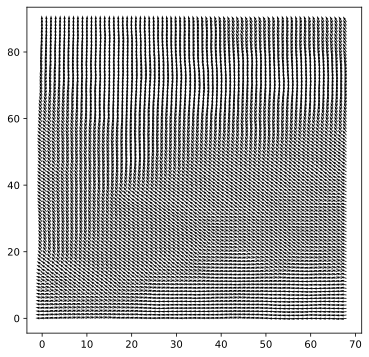

In [150]:
f,ax = plt.subplots(figsize=(6,6))
ax.quiver(np.cos(pg.a), np.sin(pg.a), scale=50)

In [173]:
n_fills = 3
fill_angles = [-30, -40, -50]
n_iter_choices = np.array(list(itertools.product(*[[0, 100]] * n_fills)))
n_iter_choices = n_iter_choices[1:-1,:]

In [174]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=15, xscale=3, yscale=3)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=1, high=15, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.1, high=1.7) + np.random.uniform(low=0., high=0.3, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    P.fills = []
    n_iter_choice = n_iter_choices[np.random.choice(n_iter_choices.shape[0])]
    for i in range(n_fills):
        stp = ScaleTransPrms(
            n_iters=n_iter_choice[i],
            d_buffer=np.random.uniform(low=-0.6, high=-0.2),
            d_translate_factor=0.8,
            angles=np.radians(fill_angles[i]),)
        stp.d_buffers += np.random.uniform(-0.1, 0.1, size=stp.d_buffers.shape)
        fill = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
        P.fills.append(fill)
    
    gpolys.append(P)

In [175]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [176]:
fill_sets = []
for i in range(n_fills):
    fill_sets.append([])
    
for p in gpolys:
    for i in range(n_fills):
        fill_sets[i].append(p.fills[i].intersection(p.p.buffer(1e-6)))

layers = []
for fill_set in fill_sets:
    filter_fills = [l for l in fill_set if l.length > 0.2]
    layers.append(gp.merge_LineStrings(filter_fills))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [178]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0091_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 9


In [6]:
page_x_inches: float = 6 # inches
page_y_inches: float = 6 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0063,
    'noiseSeed':8
}
buffer_style = 3

In [28]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

# start_area = drawbox.centroid.buffer(brad*0.47)
start_area = drawbox.buffer(-10)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=25, ystep=25)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [29]:
n_fills = 3
fill_angles = [-30, -90, -150]
n_iter_choices = np.array(list(itertools.product(*[[0, 100]] * n_fills)))
n_iter_choices = n_iter_choices[1:-1,:]

In [42]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=30, xscale=5, yscale=5)
    pc.init_particles(start_bounds=start_area)
    n_steps = np.random.randint(low=4, high=17, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=0.7) + np.random.uniform(low=0., high=3.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    P.fills = []
    n_iter_choice = n_iter_choices[np.random.choice(n_iter_choices.shape[0])]
    for i in range(n_fills):
        stp = ScaleTransPrms(
            n_iters=n_iter_choice[i],
            d_buffer=np.random.uniform(low=-0.6, high=-0.25),
            d_translate_factor=0.7,
            angles=np.radians(fill_angles[i]),)
        stp.d_buffers += np.random.uniform(-0.1, 0.1, size=stp.d_buffers.shape)
        fill = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
        P.fills.append(fill)
    
    gpolys.append(P)

In [43]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [44]:
fill_sets = []
for i in range(n_fills):
    fill_sets.append([])
    
for p in gpolys:
    for i in range(n_fills):
        fill_sets[i].append(p.fills[i].intersection(p.p.buffer(1e-6)))

layers = []
for fill_set in fill_sets:
    filter_fills = [l for l in fill_set if l.length > 0.2]
    layers.append(gp.merge_LineStrings(filter_fills))

In [45]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-05T11:19:32.076844 
 
 
 
 
 
 <polyline points="132.8646,91.5474 130.4037,89.1681 123.0529,96.7712 122.8169,97.0281 120.3327,99.8766 120.2194,100.0099 118.8001,101.7246 105.5573,90.4042 97.9603,82.3133 89.1756,90.5618 88.8472,90.8878 86.2409,93.625 86.0719,93.8079 83.5492,96.6222 83.4306,96.7575 80.9697,99.6261 80.7906,99.8421 78.4284,102.7925 78.0406,103.3182 75.9186,106.4458 75.7802,106.6568 73.7546,109.8477 73.5471,110.1929 71.6793,113.4786 71.5844,113.6501 69.795,116.9791 69.4805,117.6311 67.989,121.1039 64.725,128.7033 77.2707,134.0917 77.1367,134.697 77.0766,135.0491 76.6238,138.8014 76.5985,139.1509 76.5069,142.9293 76.5177,143.3128 76.8225,147.08 76.8577,147.3702 77.4624,151.101 77.4733,151.1648 78.1409,154.8679 78.7586,158.4831 79.1574,161.8713 79.0533,165.1484 78.5239,168.5085 77.6672,172.0354 77.6452,172.1318 76.8527,175.8273 76.0859,179.4027 83.2366,180.9361 84.7855,173.7136 85.666,170.089 85.7248,169.7949 86.313,166.0614 86.3557,165.6084 86.4756,161.8307 86.4524,161.2872 86.4189,161.0028 89.2859,160.4248 89.5403,162.5622 95.493,161.8534 95.3656,160.7831 100.1588,160.3819 100.1456,160.5818 103.3186,160.7907 103.5317,157.553 103.6022,157.5388 103.5498,157.2788 103.6711,155.4367 103.7651,154.1065 109.0879,155.0228 110.5755,146.3814 111.3964,143.0372 112.4541,139.6224 113.5182,136.4103 113.993,135.4355 113.8451,135.8768 112.8232,139.5156 112.5686,140.6278 111.9056,144.3487 111.7624,145.4567 111.457,149.2239 111.4287,149.688 111.2841,153.1956 110.9877,156.5915 110.6356,159.9486 110.1267,163.183 109.5148,166.3518 108.6845,169.5982 108.365,170.7806"/>
 
 
 
 
 
 <polyline points="145.5865,183.6372 146.0775,182.1527 140.0528,180.1601 140.7741,178.144 137.6213,177.0161 138.1074,175.9934 111.8246,163.5016 104.0366,179.8877 102.4115,183.0916 102.2484,183.4237 100.7554,186.5627 99.1927,189.5233 97.4316,192.7217 97.3894,192.7989 95.9455,195.4591 94.4201,197.6859 93.8318,197.3643 91.1077,202.347 87.8379,206.9055 85.6389,209.9501 85.2776,210.4741 83.4419,213.2653 81.5457,215.8012 79.3182,218.636 70.3283,230.0766 73.8889,232.8745 72.8723,234.2115 72.7243,234.4156 70.5771,237.5259 67.4556,242.0474 73.096,245.9413 71.2833,248.1822 68.9084,251.0772 68.788,251.2268 66.6468,253.9398 64.4735,256.3597 62.1645,258.7323 59.5855,261.1196 52.127,268.0235 52.9831,268.9483 47.9017,273.0805 62.2254,290.6941"/>
 
 
 
 <polyline points="123.2236,275.817 126.0336,274.7598 129.5302,273.4881 130.8938,272.8811 134.1774,271.1349 137.4807,269.4259 138.0729,269.0953 144.3271,265.3381 153.8216,278.295 164.4053,270.5395 164.6161,270.3804 167.5567,268.0951 170.5241,265.8448 171.2125,265.2687 173.991,262.7064 174.2925,262.4155 176.9533,259.7312 183.5296,253.0968 170.2606,239.9441 161.1711,249.114 158.8771,251.2295 156.2236,253.2417 156.1358,253.3091 155.163,254.0651 153.4826,251.5806 153.5938,251.4744 154.3494,250.6783 156.8129,247.812 157.0132,247.5722 159.2841,244.775 161.6425,242.0512 161.8385,241.8185 164.2335,238.8947 164.2924,238.8222 166.6628,235.8784 173.6467,227.2051 167.1836,222.0009 168.5481,220.1613 170.7861,217.149 173.0377,214.1409 173.1186,214.0316 175.35,210.9812 175.6055,210.6184 177.2461,208.1981 179.2042,206.0267 187.4897,196.8386 169.1134,180.2675 162.9523,187.0999 149.0866,179.0223 146.2599,183.8745 145.5865,183.6372"/>
 
 
 
 
 <polyline points="116.0315,276.9649 117.2243,276.5755 120.749,275.4826 121.3099,275.2903 124.7808,273.9844 128.2408,272.7259 129.5202,272.1564 132.7698,270.4284 136.0611,268.7256 136.6167,268.4154 143.883,264.0502 153.3094,276.9142 162.8235,269.9424 163.0194,269.7946 165.9588,267.5102 168.9073,265.2744 169.5472,264.7388 172.2915,262.208 172.5718,261.9376 175.2221,259.2639 180.8715,253.5645 169.4729,242.2658 161.2895,250.5215 158.9272,252.7 156.2263,254.7481 156.1447,254.8108 154.0644,256.4275 150.9726,251.8561 151.8651,251.004 152.576,250.255 155.0123,247.4203 155.2008,247.1947 157.479,244.3885 159.8452,241.6557 160.0296,241.4367 162.41

In [46]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0092_perlin_flow_erode_frays_color_mix.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 10

In [47]:
page_x_inches: float = 8.5 # inches
page_y_inches: float = 11 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':3,
    'ystep':3,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0013,
    'noiseSeed':8
}
buffer_style = 3

In [65]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

# start_area = drawbox.centroid.buffer(brad*0.47)
start_area = drawbox.buffer(-5, cap_style=3, join_style=3)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=25, ystep=25)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

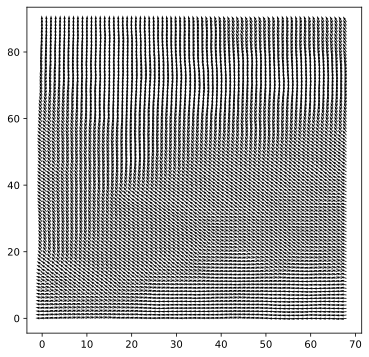

In [150]:
f,ax = plt.subplots(figsize=(6,6))
ax.quiver(np.cos(pg.a), np.sin(pg.a), scale=50)

In [66]:
n_fills = 2
fill_angles = [-30, -40, ]
n_iter_choices = np.array(list(itertools.product(*[[0, 100]] * n_fills)))
n_iter_choices = n_iter_choices[[-1], :]

In [67]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=35, xscale=5, yscale=5)
    pc.init_particles(start_bounds=drawbox)
    n_steps = np.random.randint(low=1, high=15, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.1, high=1.7) + np.random.uniform(low=0., high=0.3, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))
    P.fills = []
    n_iter_choice = n_iter_choices[np.random.choice(n_iter_choices.shape[0])]
    for i in range(n_fills):
        stp = ScaleTransPrms(
            n_iters=n_iter_choice[i],
            d_buffer=np.random.uniform(low=-0.6, high=-0.2),
            d_translate_factor=0.8,
            angles=np.radians(fill_angles[i]),)
        stp.d_buffers += np.random.uniform(-0.1, 0.1, size=stp.d_buffers.shape)
        fill = gp.merge_LineStrings([p.boundary for p in gp.scale_trans(P.p, **stp.prms)])
        P.fills.append(fill)
    
    gpolys.append(P)

In [68]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except:
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [69]:
fill_sets = []
for i in range(n_fills):
    fill_sets.append([])
    
for p in gpolys:
    for i in range(n_fills):
        fill_sets[i].append(p.fills[i].intersection(p.p.buffer(1e-6)))

layers = []
for fill_set in fill_sets:
    filter_fills = [l for l in fill_set if l.length > 0.2]
    layers.append(gp.merge_LineStrings(filter_fills))

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [71]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0093_perlin_flow_erode_frays.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 11

In [31]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':3,
    'ystep':3,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0053,
    'noiseSeed':3
}
buffer_style = 3

In [44]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.buffer(-10, cap_style=3, join_style=3)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=25, ystep=35)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

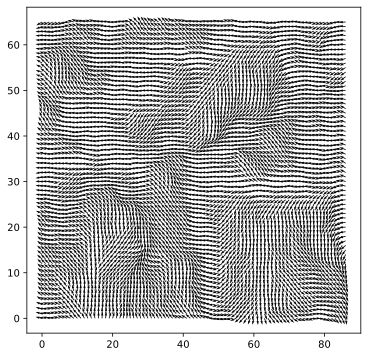

In [33]:
f,ax = plt.subplots(figsize=(6,6))
ax.quiver(np.cos(pg.a), np.sin(pg.a), scale=50)

In [61]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=40, xscale=5, yscale=5)
    pc.init_particles(start_bounds=start_area)
    n_steps = np.random.randint(low=3, high=20, size=len(pc.particles))
    pc.step(n_steps)

    buffer_distances = np.random.uniform(low=0.3, high=3.3) + np.random.uniform(low=0., high=1.7, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))

    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.75, high=-0.3), 
        angles=-90,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill_scale_trans(**stp.prms)
    gpolys.append(P)

In [62]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except :
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [63]:
ifills = []
for p in gpolys:
    try:
        ifills.append(p.intersection_fill)
    except:
        pass

splits = utils.random_split(ifills, n_layers=5)
layers = [gp.merge_LineStrings(split) for split in splits]

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='layer')

In [65]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0100_perlin_flow_erode_frays_occlude.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.01mm linemerge --tolerance 0.1mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 12

In [6]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':3,
    'ystep':3,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0083,
    'noiseSeed':3
}
buffer_style = 3

In [13]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.buffer(-10, cap_style=3, join_style=3)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=15, ystep=55)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

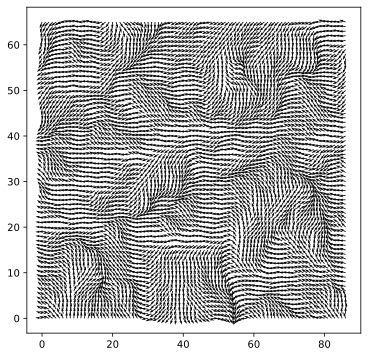

In [70]:
f,ax = plt.subplots(figsize=(6,6))
ax.quiver(np.cos(pg.a), np.sin(pg.a), scale=50)

In [14]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=60, xscale=7, yscale=12)
    pc.init_particles(start_bounds=start_area)
    n_steps = np.random.randint(low=1, high=15, size=len(pc.particles))
    pc.step(n_steps)
    
    buffer_distances = np.random.uniform(low=0.3, high=6.3) + np.random.uniform(low=0., high=0.5, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        bd = np.interp(line.centroid.x, [10, 270], [0.1, 3])
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))

    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.65, high=-0.3), 
        angles=-90,

    )
    stp.d_buffers += np.random.uniform(-0.03, 0.03, size=stp.d_buffers.shape)
    P.fill_scale_trans(**stp.prms)
    gpolys.append(P)

In [15]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except :
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [16]:
ifills = []
for p in gpolys:
    try:
        ifills.append(p.intersection_fill)
    except:
        pass

splits = utils.random_split(ifills, n_layers=5)
layers = [gp.merge_LineStrings(split) for split in splits]

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='none')

In [18]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0101_perlin_flow_erode_frays_occlude.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.01mm linemerge --tolerance 0.1mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 13

In [20]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

perlin_grid_params = {
    'xstep':1,
    'ystep':1,
    'lod':10,
    'falloff':None,
    'noise_scale':0.0193,
    'noiseSeed':3
}
buffer_style = 3

In [40]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)

xmin, ymin, xmax, ymax = drawbox.bounds
brad = np.min([gp.get_width(drawbox), gp.get_height(drawbox)])

start_area = drawbox.buffer(-10, cap_style=3, join_style=3)
pg = gp.PerlinGrid(start_area, **perlin_grid_params)
xcs, ycs = gp.overlay_grid(start_area, xstep=20, ystep=75)
start_pts = [Point(x,y) for x,y in itertools.product(xcs, ycs)]
start_pts = [p for p in start_pts if start_area.contains(p)]

In [41]:
# f,ax = plt.subplots(figsize=(6,6))
# ax.quiver(np.cos(pg.a), np.sin(pg.a), scale=50)

In [57]:
gpolys = []
for p in start_pts:

    pc = ParticleCluster(pos=p, perlin_grid=pg)
    pc.gen_start_pts_gaussian(n_particles=60, xscale=8, yscale=13)
    pc.init_particles(start_bounds=start_area)
    n_steps = int(np.interp(pc.pos.centroid.x, [1, 270], [1, 30]))
#     n_steps = np.random.randint(low=1, high=15, size=len(pc.particles))
    pc.step(n_steps)
    
    buffer_distances = np.random.uniform(low=0.3, high=6.3) + np.random.uniform(low=0., high=0.5, size=len(pc.lines))
    polys = []
    for line, bd in zip(pc.lines, buffer_distances):
        bd = np.interp(line.centroid.x, [10, 270], [0.1, 3.5])
        poly = line.buffer(bd,
            cap_style=buffer_style,
            join_style=buffer_style)
        polys.append(poly)

    P = gp.Poly(so.unary_union(polys))

    stp = ScaleTransPrms(
        d_buffer=np.random.uniform(low=-0.4, high=-0.2), 
        angles=-60,

    )
    stp.d_buffers += np.random.uniform(-0.06, 0.06, size=stp.d_buffers.shape)
    P.fill_scale_trans(**stp.prms)
    gpolys.append(P)

In [58]:
zorder = np.random.permutation(len(gpolys))

for z, gpoly in zip(zorder, gpolys):
    gpoly.z = z

for gp0, gp1 in itertools.combinations(gpolys, r=2):
    try:
        overlaps = gp0.p.overlaps(gp1.p)
    except :
        gp0.p = gp0.p.buffer(1e-6)
        gp1.p = gp1.p.buffer(1e-6)
        overlaps = gp0.p.overlaps(gp1.p)
    if overlaps:
        if gp0.z > gp1.z:
            gp1.p = occlude(top=gp0.p, bottom=gp1.p)
        elif gp0.z < gp1.z:
            gp0.p = occlude(top=gp1.p, bottom=gp0.p)

In [59]:
ifills = []
for p in gpolys:
    try:
        ifills.append(p.intersection_fill)
    except:
        pass

splits = utils.random_split(ifills, n_layers=5)
layers = [gp.merge_LineStrings(split) for split in splits]

In [60]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)
sk.display(color_mode='none')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-08T19:30:24.904598 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="122.8305,229.7289 123.9374,230.1176 123.9374,230.1176 126.3233,230.9554 126.5388,231.0311 126.6038,230.8462 127.9039,231.2102 131.1322,233.0114 131.2408,233.0637 134.1679,234.2658 137.721,237.4363 140.1265,240.2996 142.482,243.1991 144.3495,246.4392 144.5982,246.8707 145.4612,246.3732 143.3135,242.6429 140.9003,239.6724 140.8884,239.658 138.4898,236.8029 138.377,236.6868 135.5909,234.2005 135.2193,233.8689 135.2142,233.8746 131.5153,232.3557 128.2997,230.5616 128.08,230.4711 124.5124,229.4721 124.1468,229.3698 123.9788,229.9697 116.6591,225.1426 113.7705,222.7254 113.5953,222.5788 113.3021,222.9292 116.3483,225.4783 116.4267,225.5367 122.6423,229.6356"/>
 
 
 
 
 
 
 
 <polygon points="132.4163,282.8979 135.7956,280.3443 135.8269,280.3198 138.7074,277.9748 138.8416,277.845 141.2037,275.1374 141.4244,274.7414 142.5005,271.2568 142.6384,270.81 140.2536,270.0736 140.7651,267.2162 140.7815,267.0675 140.9438,263.3583 140.9442,263.2709 140.816,259.5182 140.7993,259.0277 139.8182,259.0612 139.9633,263.3099 139.8004,267.034 139.1581,270.6222 137.4903,273.1395 135.2209,271.6231 132.9311,275.0499 130.4322,277.8226 127.6322,280.3156 124.6822,282.6619 124.3937,282.8913 124.8526,283.4682 128.0853,280.8971 128.1279,280.8613 130.9116,278.3827 130.9894,278.3053 133.466,275.5576 133.5546,275.4436 135.1911,272.9946 139.3995,275.7829 138.1277,277.2407 135.2342,279.5964 132.2255,281.8699 131.1028,282.7182 129.35,283.8796 129.2751,283.9345 126.3604,286.2872 123.4299,288.6841 123.1533,288.9103 123.6057,289.4634 126.807,286.8451 129.7339,284.4824 132.3192,282.7695"/>
 
 
 
 
 
 
 <polygon points="116.8081,259.243 116.4108,259.4753 118.4317,262.9331 119.3725,264.7007 118.8026,265.004 120.6829,268.5369 121.2475,270.3714 121.0276,273.524 121.0116,273.7536 121.6546,273.7984 121.5172,275.7682 120.1013,279.2298 120.0081,279.4575 120.2407,279.5527 119.2787,282.3334 117.3135,285.5312 117.1881,285.735 118.1251,286.3108 116.3249,289.6296 116.2122,289.8372 116.6275,290.0625 118.5392,286.5382 120.5103,283.3309 122.6683,280.3296 122.7668,280.1519 124.1695,276.7226 124.2589,276.5039 122.3771,275.7342 122.6075,272.431 123.9315,272.9712 125.4082,269.3517 125.4706,268.9145 125.103,265.3848 125.0556,265.1746 123.8256,261.6931 123.8128,261.6592 122.4189,258.1595 122.3132,257.8942 121.7825,258.1056 123.2847,261.8769 124.5305,2

In [62]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0102_perlin_flow_erode_frays_occlude.svg'

sk.save(savepath)

In [70]:
vpype_commands = 'reloop linesimplify --tolerance 0.01mm linemerge --tolerance 0.1mm reloop linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write {savepath}'

os.system(vpype_str)

0